In [68]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import  CountVectorizer, TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import nltk
import seaborn as sns
from string import punctuation
import unidecode


In [3]:
reviews=pd.read_csv('imdb-reviews-pt-br.csv')
reviews.head()

,id,text_en,text_pt,sentiment
0,1,Once again Mr. Costner has dragged out a movie...,"Mais uma vez, o Sr. Costner arrumou um filme p...",neg
1,2,This is an example of why the majority of acti...,Este é um exemplo do motivo pelo qual a maiori...,neg
2,3,"First of all I hate those moronic rappers, who...","Primeiro de tudo eu odeio esses raps imbecis, ...",neg
3,4,Not even the Beatles could write songs everyon...,Nem mesmo os Beatles puderam escrever músicas ...,neg
4,5,Brass pictures movies is not a fitting word fo...,Filmes de fotos de latão não é uma palavra apr...,neg


In [4]:
np.random.seed(42)
x=reviews.text_pt
y=reviews.sentiment
x_train,x_test,y_train,y_test=train_test_split(x,y,stratify=y,test_size=0.25)

In [5]:
reviews.sentiment.value_counts()

neg    24765
pos    24694
Name: sentiment, dtype: int64

In [6]:
classification=reviews.sentiment.replace(['neg','pos'],[0,1])
classification.head()

0    0
1    0
2    0
3    0
4    0
Name: sentiment, dtype: int64

In [7]:
reviews['classification']=classification
reviews.head()

,id,text_en,text_pt,sentiment,classification
0,1,Once again Mr. Costner has dragged out a movie...,"Mais uma vez, o Sr. Costner arrumou um filme p...",neg,0
1,2,This is an example of why the majority of acti...,Este é um exemplo do motivo pelo qual a maiori...,neg,0
2,3,"First of all I hate those moronic rappers, who...","Primeiro de tudo eu odeio esses raps imbecis, ...",neg,0
3,4,Not even the Beatles could write songs everyon...,Nem mesmo os Beatles puderam escrever músicas ...,neg,0
4,5,Brass pictures movies is not a fitting word fo...,Filmes de fotos de latão não é uma palavra apr...,neg,0


In [8]:
text=['esse filme é bom','Filme péssimo']
vectorize=CountVectorizer(lowercase=False)
bag_of_words=vectorize.fit_transform(text)

In [9]:
vectorize.get_feature_names()

['Filme', 'bom', 'esse', 'filme', 'péssimo']

In [10]:
bag_of_words

<2x5 sparse matrix of type '<class 'numpy.int64'>'
	with 5 stored elements in Compressed Sparse Row format>

In [11]:
matrix=pd.DataFrame.sparse.from_spmatrix(bag_of_words,columns=vectorize.get_feature_names())


In [12]:
matrix

,Filme,bom,esse,filme,péssimo
0,0,1,1,1,0
1,1,0,0,0,1


In [13]:
vectorize=CountVectorizer(lowercase=False, max_features=50)
bag_of_words=vectorize.fit_transform(reviews.text_pt)
bag_of_words.shape

(49459, 50)

In [14]:
np.random.seed(42)
x=bag_of_words
y=reviews.classification
x_train,x_test,y_train,y_test=train_test_split(x,y,stratify=y,test_size=0.25)
logistic_regression=LogisticRegression()
logistic_regression.fit(x_train,y_train)
accuracy=logistic_regression.score(x_test,y_test)
print(f'{accuracy*100}%')

65.07076425394258%


In [15]:
def text_classification(dataframe,column_text,column_label):
    vectorize=CountVectorizer(lowercase=False, max_features=50)
    bag_of_words=vectorize.fit_transform(dataframe[column_text])
    np.random.seed(42)
    x=bag_of_words
    y=dataframe[column_label]
    x_train,x_test,y_train,y_test=train_test_split(x,y,stratify=y,test_size=0.25)
    logistic_regression=LogisticRegression()
    logistic_regression.fit(x_train,y_train)
    accuracy=logistic_regression.score(x_test,y_test)
    print(f'{round(accuracy,3)*100}%')

In [16]:
text_classification(reviews,'text_pt','classification')

65.10000000000001%


In [17]:
every_word=' '.join([text for text in reviews.text_pt])


In [18]:
word_clound=WordCloud(width=800,height=500,max_font_size=110,collocations=False).generate(every_word)

(-0.5, 799.5, 499.5, -0.5)

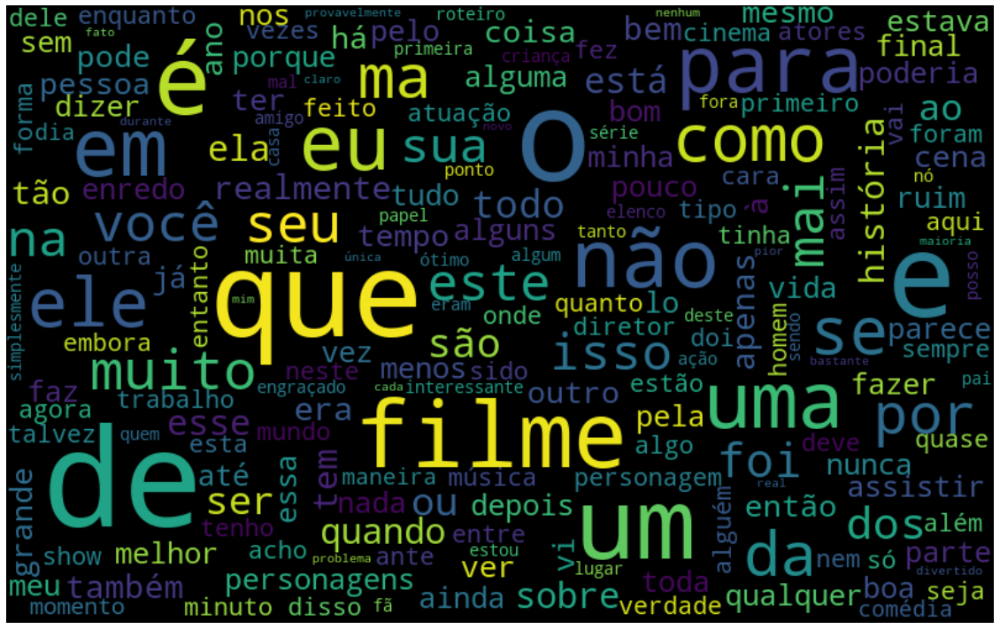

In [19]:
plt.figure(figsize=(20,15))
plt.imshow(word_clound,interpolation='bilinear')
plt.axis(False)

In [20]:
reviews.query("sentiment=='pos'")

,id,text_en,text_pt,sentiment,classification
12389,12391,I went and saw this movie last night after bei...,Eu fui e vi este filme ontem à noite depois de...,pos,1
12390,12392,Actor turned director Bill Paxton follows up h...,"O diretor do ator, Bill Paxton, segue sua prom...",pos,1
12391,12393,As a recreational golfer with some knowledge o...,Como um jogador de recreio com algum conhecime...,pos,1
12392,12394,"I saw this film in a sneak preview, and it is ...","Eu vi esse filme em uma prévia, e é delicioso....",pos,1
12393,12395,Bill Paxton has taken the true story of the 19...,Bill Paxton levou a verdadeira história do gol...,pos,1
...,...,...,...,...,...
49454,49456,"Seeing as the vote average was pretty low, and...","Como a média de votos era muito baixa, e o fat...",pos,1
49455,49457,"The plot had some wretched, unbelievable twist...",O enredo teve algumas reviravoltas infelizes e...,pos,1
49456,49458,I am amazed at how this movieand most others h...,Estou espantado com a forma como este filme e ...,pos,1
49457,49459,A Christmas Together actually came before my t...,A Christmas Together realmente veio antes do m...,pos,1


In [21]:
def negative_clound(text,text_columns):
    negative_text=reviews.query("sentiment=='neg'")
    every_word=' '.join([text for text in negative_text[text_columns]])
    word_clound=WordCloud(width=800,height=500,max_font_size=110,collocations=False).generate(every_word)
    plt.figure(figsize=(20,15))
    plt.imshow(word_clound,interpolation='bilinear')
    plt.axis(False)

In [22]:
def positive_clound(text,text_columns):
    positive_text=reviews.query("sentiment=='pos'")
    every_word=' '.join([text for text in positive_text[text_columns]])
    word_clound=WordCloud(width=800,height=500,max_font_size=110,collocations=False).generate(every_word)
    plt.figure(figsize=(20,15))
    plt.imshow(word_clound,interpolation='bilinear')
    plt.axis(False)

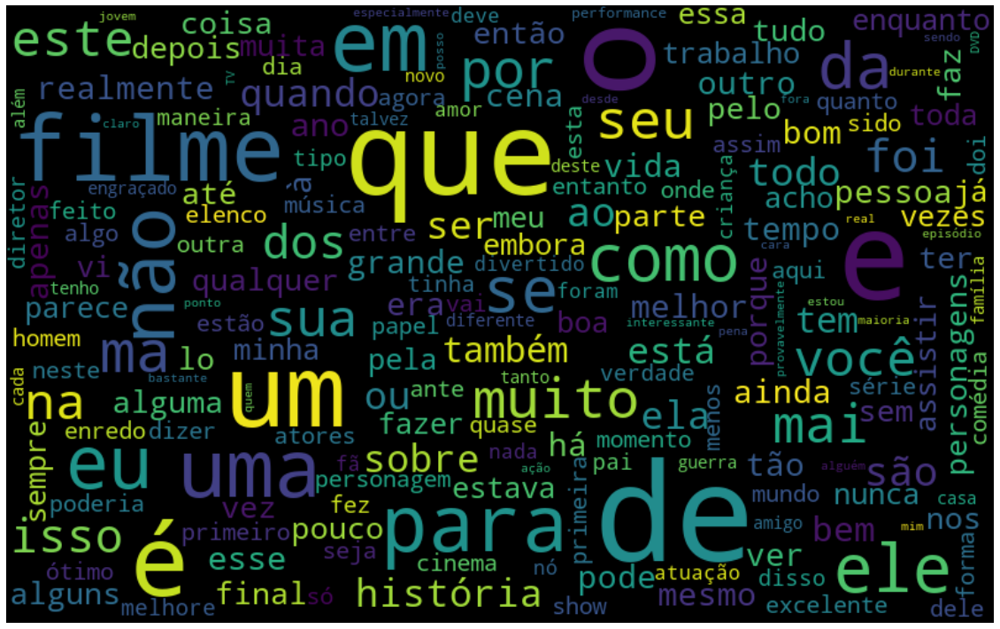

In [23]:
positive_clound(reviews,'text_pt')

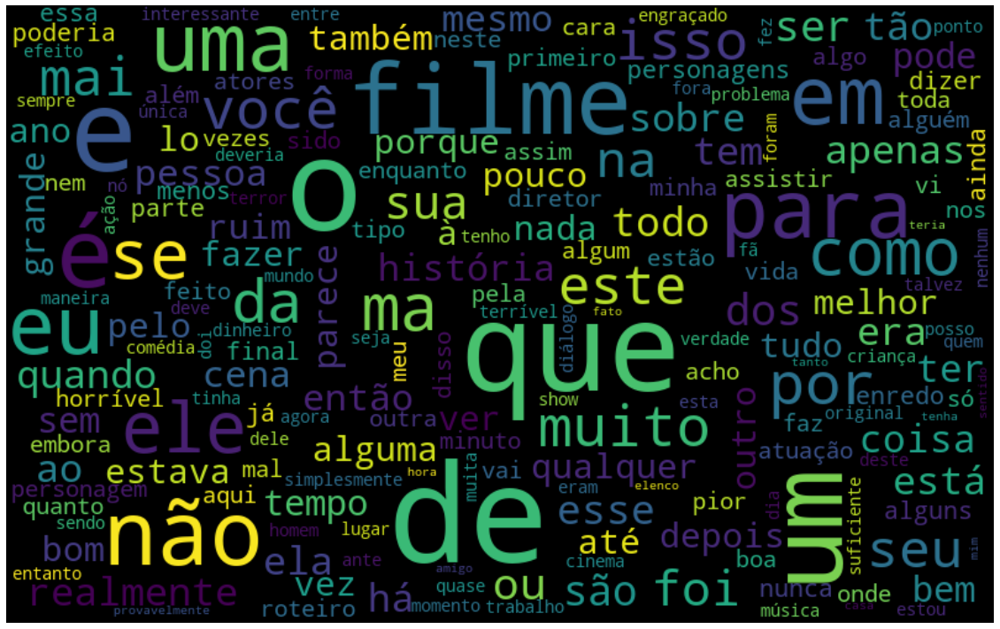

In [24]:
negative_clound(reviews,'text_pt')

In [25]:
token_space=nltk.tokenize.WhitespaceTokenizer()
setence='ESTEVAN FAZENDO EXERCICIO DE NLP'
token_setence=token_space.tokenize(setence)
token_setence

['ESTEVAN', 'FAZENDO', 'EXERCICIO', 'DE', 'NLP']

In [26]:
token_space=nltk.tokenize.WhitespaceTokenizer()
token_reviews=token_space.tokenize(every_word)
frequency=nltk.FreqDist(token_reviews)
frequency

FreqDist({'de': 417651, 'que': 325070, 'e': 299743, 'o': 244881, 'um': 216410, 'a': 210179, 'é': 192381, 'em': 132778, 'uma': 130888, 'não': 127915, ...})

In [27]:
frequency_df=pd.DataFrame({'word':list(frequency.keys()),'frequency':list(frequency.values())})
frequency_df.head()

,word,frequency
0,Mais,1538
1,uma,130888
2,"vez,",1927
3,o,244881
4,Sr.,1741


In [28]:
frequency_df.nlargest(columns='frequency',n=10)

,word,frequency
20,de,417651
14,que,325070
42,e,299743
3,o,244881
7,um,216410
102,a,210179
45,é,192381
200,em,132778
1,uma,130888
29,não,127915


In [29]:
def pareto(text_df,text_column,nth):
    
    every_word=' '.join([text for text in text_df[text_column]])

    token_space=nltk.tokenize.WhitespaceTokenizer()
    token_reviews=token_space.tokenize(every_word)

    frequency=nltk.FreqDist(token_reviews)
    frequency_df=pd.DataFrame({'word':list(frequency.keys()),'frequency':list(frequency.values())})

    plt.figure(figsize=(12,8))
    nlargest=frequency_df.nlargest(columns='frequency',n=nth)
    ax=sns.barplot(data=nlargest,x='word',y='frequency',color='gray')


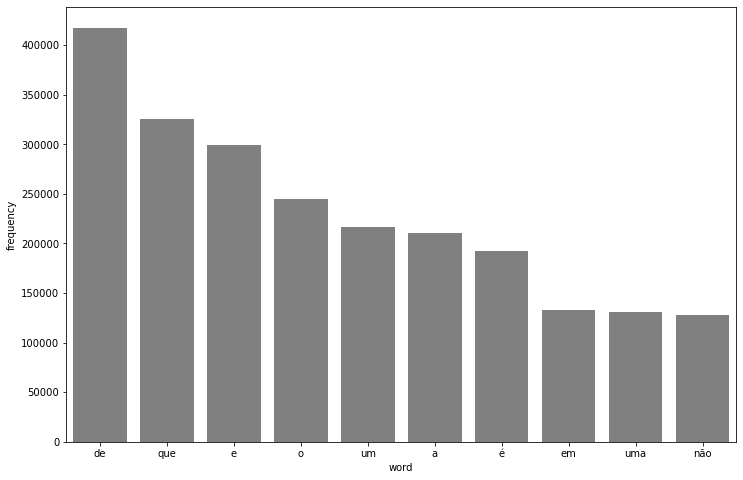

In [30]:
pareto(reviews,'text_pt',10)

In [31]:
useless_words=nltk.corpus.stopwords.words('portuguese')
useless_words[:10]

['de', 'a', 'o', 'que', 'e', 'é', 'do', 'da', 'em', 'um']

In [32]:
reviews['filter1']=' '+reviews.text_pt+' '
for useless_word in useless_words:
    reviews['filter1']=reviews.filter1.str.replace(' '+useless_word+' ',' ',regex=False)
    

In [33]:
reviews.head()

,id,text_en,text_pt,sentiment,classification,filter1
0,1,Once again Mr. Costner has dragged out a movie...,"Mais uma vez, o Sr. Costner arrumou um filme p...",neg,0,"Mais vez, Sr. Costner arrumou filme tempo nec..."
1,2,This is an example of why the majority of acti...,Este é um exemplo do motivo pelo qual a maiori...,neg,0,Este exemplo motivo maioria filmes ação mesmo...
2,3,"First of all I hate those moronic rappers, who...","Primeiro de tudo eu odeio esses raps imbecis, ...",neg,0,"Primeiro tudo odeio raps imbecis, poderiam ag..."
3,4,Not even the Beatles could write songs everyon...,Nem mesmo os Beatles puderam escrever músicas ...,neg,0,Nem Beatles puderam escrever músicas todos go...
4,5,Brass pictures movies is not a fitting word fo...,Filmes de fotos de latão não é uma palavra apr...,neg,0,"Filmes fotos latão palavra apropriada eles, v..."


In [34]:
text_classification(reviews,'filter1','classification')

65.7%


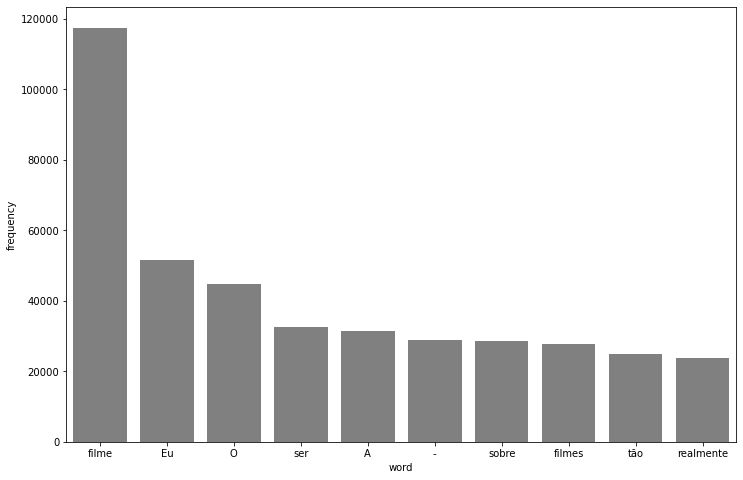

In [35]:
pareto(reviews,'filter1',10)

In [36]:
token_punctuation=nltk.tokenize.WordPunctTokenizer()

In [37]:
punct=list()
for i in punctuation:
    punct.append(i)

In [38]:
reviews['filter2']=reviews.filter1
for punctuation in punct:
    reviews['filter2']=reviews.filter2.str.replace(punctuation,'',regex=False)
    

In [39]:
reviews.head()

,id,text_en,text_pt,sentiment,classification,filter1,filter2
0,1,Once again Mr. Costner has dragged out a movie...,"Mais uma vez, o Sr. Costner arrumou um filme p...",neg,0,"Mais vez, Sr. Costner arrumou filme tempo nec...",Mais vez Sr Costner arrumou filme tempo neces...
1,2,This is an example of why the majority of acti...,Este é um exemplo do motivo pelo qual a maiori...,neg,0,Este exemplo motivo maioria filmes ação mesmo...,Este exemplo motivo maioria filmes ação mesmo...
2,3,"First of all I hate those moronic rappers, who...","Primeiro de tudo eu odeio esses raps imbecis, ...",neg,0,"Primeiro tudo odeio raps imbecis, poderiam ag...",Primeiro tudo odeio raps imbecis poderiam agi...
3,4,Not even the Beatles could write songs everyon...,Nem mesmo os Beatles puderam escrever músicas ...,neg,0,Nem Beatles puderam escrever músicas todos go...,Nem Beatles puderam escrever músicas todos go...
4,5,Brass pictures movies is not a fitting word fo...,Filmes de fotos de latão não é uma palavra apr...,neg,0,"Filmes fotos latão palavra apropriada eles, v...",Filmes fotos latão palavra apropriada eles ve...


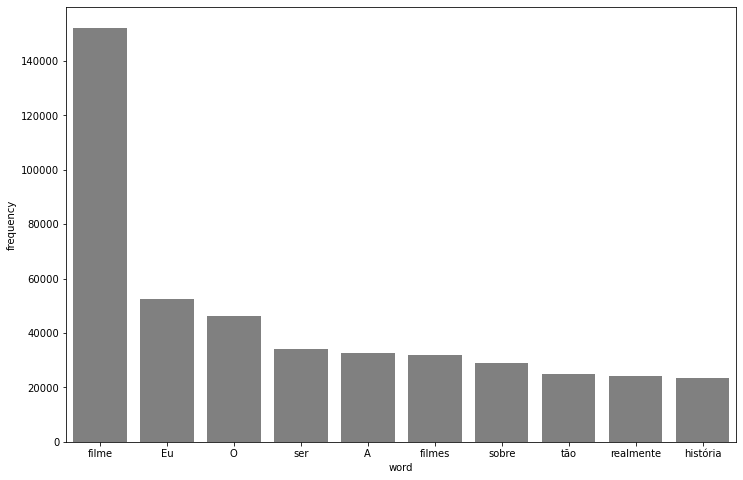

In [40]:
pareto(reviews,'filter2',10)

In [41]:
#exemplo
teste='lá bá cá, é tão'
unidecode.unidecode(teste)


'la ba ca, e tao'

In [42]:
no_accent=[unidecode.unidecode(text) for text in reviews['filter2']]
no_accent[0]

' Mais vez Sr Costner arrumou filme tempo necessario Alem terriveis sequencias resgate mar quais poucas simplesmente importei nenhum personagens A maioria fantasmas armario personagem Costers realizado logo inicio esquecido tarde importava O personagem deveriamos importar arrogante superconfiante Ashton Kutcher O problema sai garoto pensa melhor qualquer outra pessoa redor mostra sinais armario desordenado Seu unico obstaculo parece estar vencendo Costner Finalmente bem alem meio caminho Costner conta sobre fantasmas Kutchers Somos informados Kutcher levado ser melhor pressentimentos pressagios anteriores Nenhuma magica aqui tudo podia fazer desligar hora '

In [43]:
stop_words_no_accent=[unidecode.unidecode(text) for text in useless_words]

In [44]:
stop_words_no_accent[:10]

['de', 'a', 'o', 'que', 'e', 'e', 'do', 'da', 'em', 'um']

In [45]:
reviews['filter3']=no_accent
reviews['filter3']=' '+reviews.filter3+' '
for no_accent_word in stop_words_no_accent:
    reviews['filter3']=reviews.filter3.str.replace(' '+no_accent_word+' ',' ',regex=False)

In [46]:
reviews.head()

,id,text_en,text_pt,sentiment,classification,filter1,filter2,filter3
0,1,Once again Mr. Costner has dragged out a movie...,"Mais uma vez, o Sr. Costner arrumou um filme p...",neg,0,"Mais vez, Sr. Costner arrumou filme tempo nec...",Mais vez Sr Costner arrumou filme tempo neces...,Mais vez Sr Costner arrumou filme tempo nece...
1,2,This is an example of why the majority of acti...,Este é um exemplo do motivo pelo qual a maiori...,neg,0,Este exemplo motivo maioria filmes ação mesmo...,Este exemplo motivo maioria filmes ação mesmo...,Este exemplo motivo maioria filmes acao mesm...
2,3,"First of all I hate those moronic rappers, who...","Primeiro de tudo eu odeio esses raps imbecis, ...",neg,0,"Primeiro tudo odeio raps imbecis, poderiam ag...",Primeiro tudo odeio raps imbecis poderiam agi...,Primeiro tudo odeio raps imbecis poderiam ag...
3,4,Not even the Beatles could write songs everyon...,Nem mesmo os Beatles puderam escrever músicas ...,neg,0,Nem Beatles puderam escrever músicas todos go...,Nem Beatles puderam escrever músicas todos go...,Nem Beatles puderam escrever musicas todos g...
4,5,Brass pictures movies is not a fitting word fo...,Filmes de fotos de latão não é uma palavra apr...,neg,0,"Filmes fotos latão palavra apropriada eles, v...",Filmes fotos latão palavra apropriada eles ve...,Filmes fotos latao palavra apropriada verdad...


In [47]:
text_classification(reviews,'filter3','classification')

68.89999999999999%


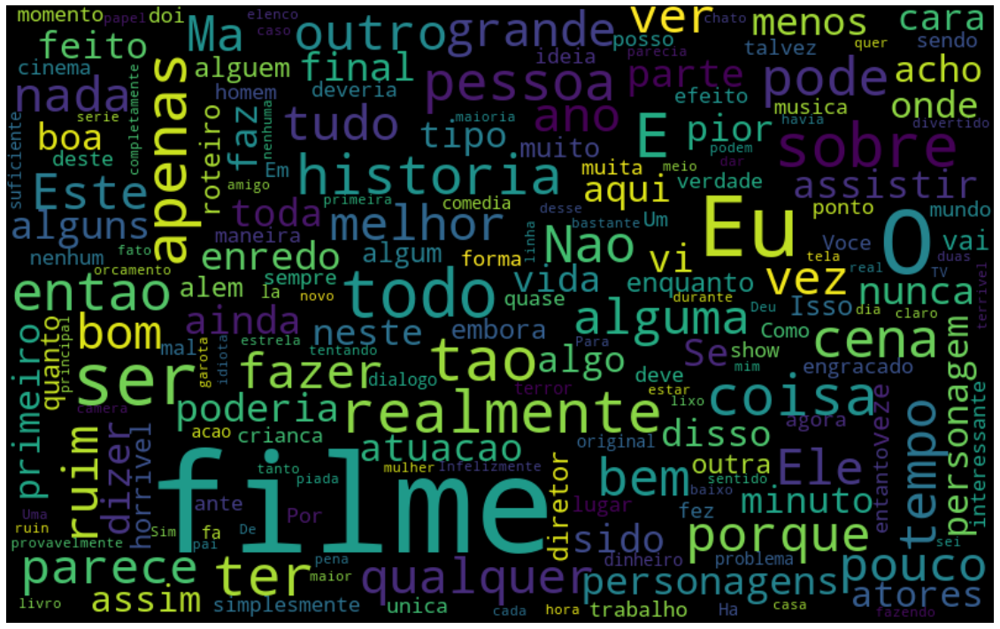

In [48]:
negative_clound(reviews,'filter3')

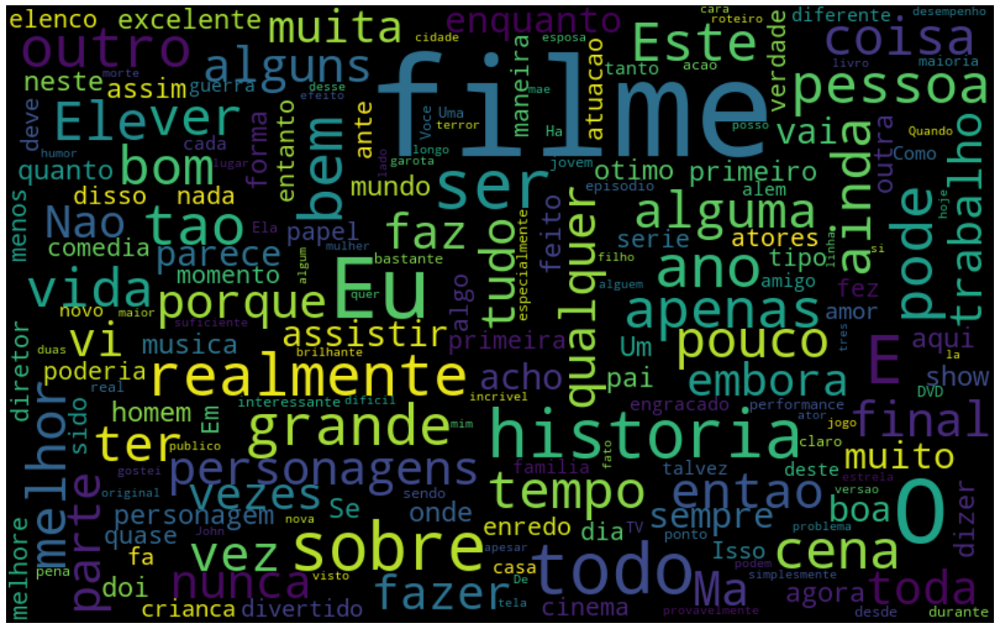

In [49]:
positive_clound(reviews,'filter3')

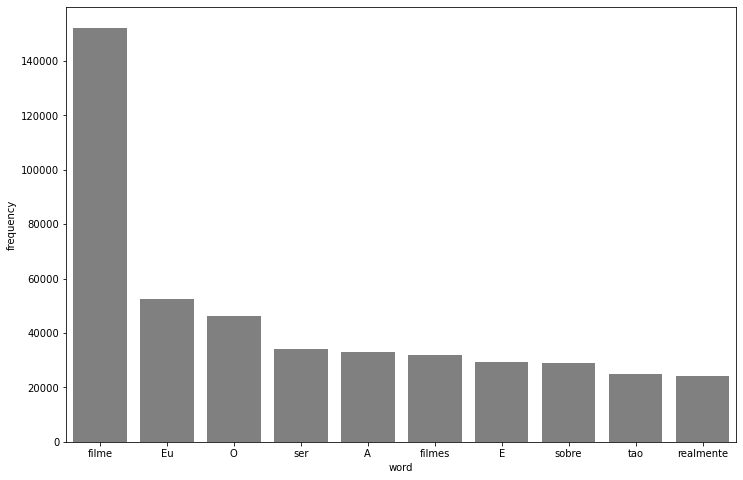

In [50]:
pareto(reviews,'filter3',10)

In [51]:
reviews['filter4']=reviews.filter3
reviews['filter4']=' '+reviews.filter4+' '
reviews.filter4=reviews.filter4.str.lower()
for no_accent_word in stop_words_no_accent:
    reviews['filter4']=reviews.filter4.str.replace(' '+no_accent_word.lower()+' ',' ',regex=False)

In [52]:
reviews.text_pt[0]

'Mais uma vez, o Sr. Costner arrumou um filme por muito mais tempo do que o necessário. Além das terríveis seqüências de resgate no mar, das quais há muito poucas, eu simplesmente não me importei com nenhum dos personagens. A maioria de nós tem fantasmas no armário, e o personagem Costers é realizado logo no início, e depois esquecido até muito mais tarde, quando eu não me importava. O personagem com o qual deveríamos nos importar é muito arrogante e superconfiante, Ashton Kutcher. O problema é que ele sai como um garoto que pensa que é melhor do que qualquer outra pessoa ao seu redor e não mostra sinais de um armário desordenado. Seu único obstáculo parece estar vencendo Costner. Finalmente, quando estamos bem além do meio do caminho, Costner nos conta sobre os fantasmas dos Kutchers. Somos informados de por que Kutcher é levado a ser o melhor sem pressentimentos ou presságios anteriores. Nenhuma mágica aqui, era tudo que eu podia fazer para não desligar uma hora.'

In [53]:
reviews.filter4[0]

'   vez sr costner arrumou filme tempo necessario alem terriveis sequencias resgate mar quais poucas simplesmente importei nenhum personagens maioria fantasmas armario personagem costers realizado logo inicio esquecido tarde importava personagem deveriamos importar arrogante superconfiante ashton kutcher problema sai garoto pensa melhor qualquer outra pessoa redor mostra sinais armario desordenado unico obstaculo parece estar vencendo costner finalmente bem alem meio caminho costner conta sobre fantasmas kutchers informados kutcher levado ser melhor pressentimentos pressagios anteriores nenhuma magica aqui tudo podia fazer desligar hora   '

In [54]:
text_classification(reviews,'filter4','classification')

68.5%


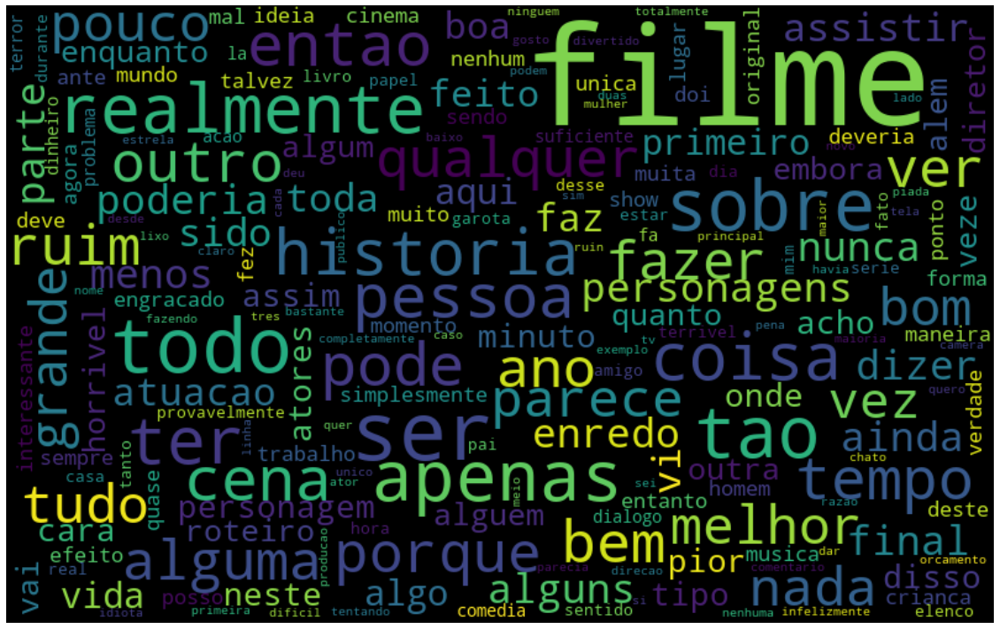

In [55]:
negative_clound(reviews,'filter4')

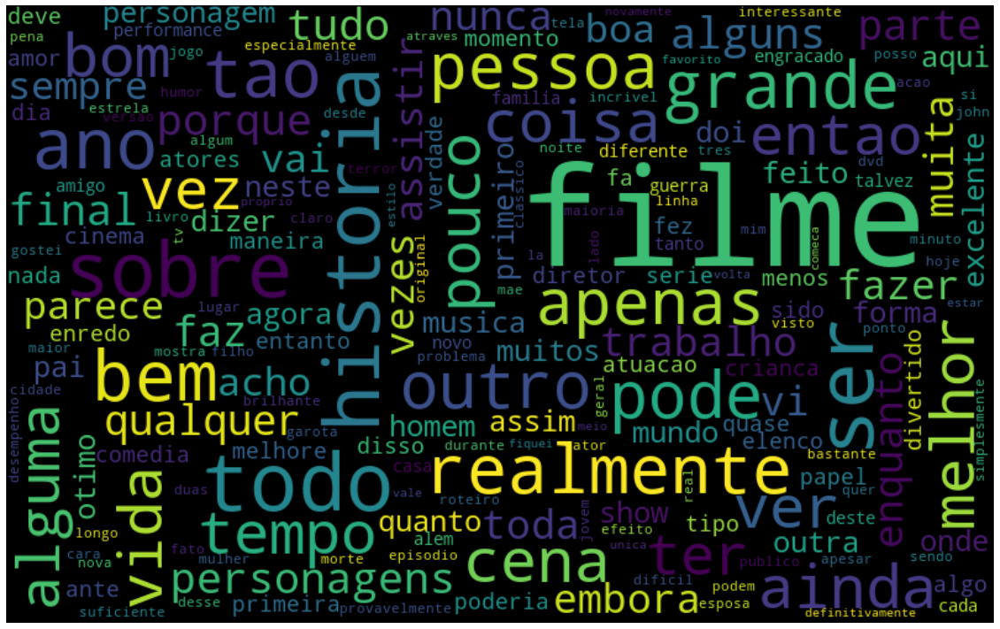

In [56]:
positive_clound(reviews,'filter4')

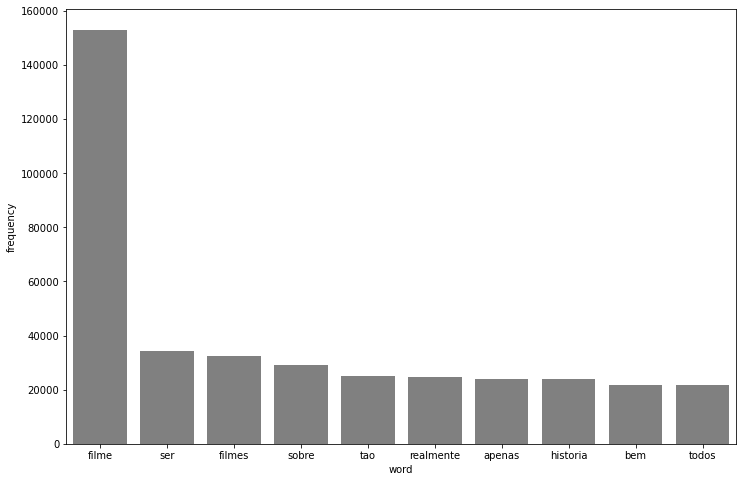

In [57]:
pareto(reviews,'filter4',10)

In [58]:
stemmer=nltk.RSLPStemmer()
stemmer.stem('Correria')

'corr'

In [59]:
#stemmer=nltk.RSLPStemmer()

#reviews['filter5']=reviews.filter4.apply(lambda x: [stemmer.stem(y) for y in x])


In [61]:
stemmer=nltk.RSLPStemmer()
frase_processada = list()
for review in reviews["filter4"]:
    nova_frase = list()
    palavras_texto = token_punctuation.tokenize(review)
    for palavra in palavras_texto:
            nova_frase.append(stemmer.stem(palavra))
    frase_processada.append(' '.join(nova_frase))

reviews["filter5"] = frase_processada

In [62]:
text_classification(reviews,'filter5','classification')

68.8%


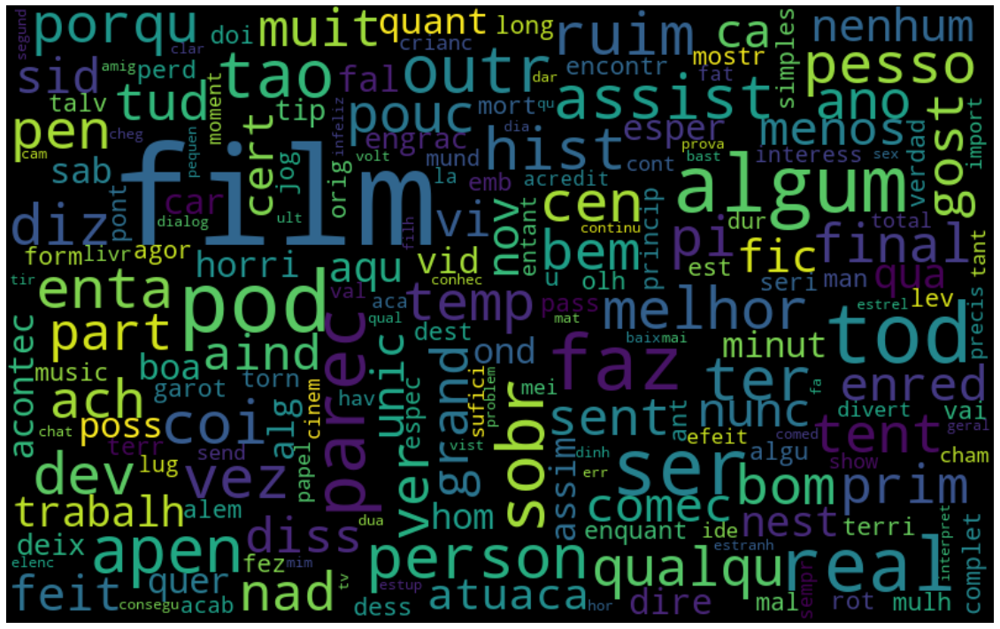

In [63]:
negative_clound(reviews,'filter5')

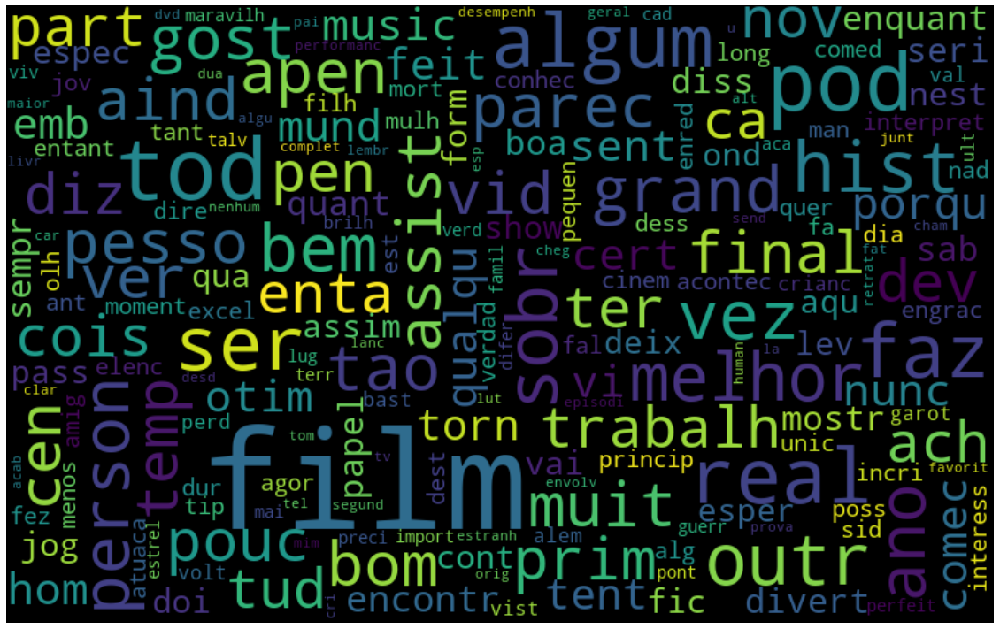

In [64]:
positive_clound(reviews,'filter5')

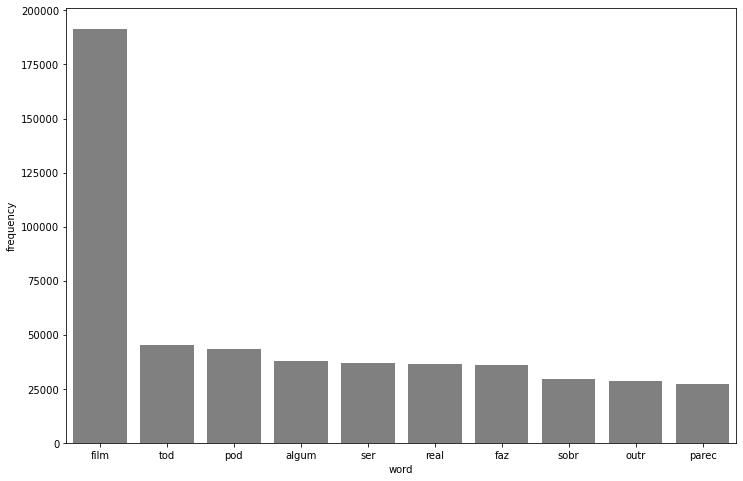

In [65]:
pareto(reviews,'filter5',10)

In [66]:
reviews.filter5

0        vez sr costn arrum film temp necessari alem te...
1        exempl motiv maior film aca mesm gener chat na...
2        prim tud odei rap imbecil pod agir arm pressio...
3        beatl pud escrev music tod gost emb walt hill ...
4        film fot lata palavr apropri verdad tant ous q...
                               ...                        
49454    med vot baix fat funcionari loc ach tud bem mu...
49455    enred algum reviravolt infeliz inacredita enta...
49456    espant form film maior outr med 5 estrel men f...
49457    christm togeth real vei ant temp cri john denv...
49458    dram roman cl trabalh dire martin ritt tao ina...
Name: filter5, Length: 49459, dtype: object

In [71]:
tfidf=TfidfVectorizer(lowercase=False, max_features=50)

array_raw_tfidf=tfidf.fit_transform(reviews.text_pt)
x_train,x_test,y_train,y_test=train_test_split(array_raw_tfidf,reviews.classification,random_state=42)

logistic_regression.fit(x_train,y_train)
accuracy_tfidf=logistic_regression.score(x_test,y_test)
print(f'A acurácia é de {accuracy_tfidf*100}% ')

A acurácia é de 66.0088960776385% 


In [73]:
tfidf=TfidfVectorizer(lowercase=False, max_features=50)

array_filter5_tfidf=tfidf.fit_transform(reviews.filter5)
x_train,x_test,y_train,y_test=train_test_split(array_filter5_tfidf,reviews.classification,random_state=42)

logistic_regression.fit(x_train,y_train)
accuracy_tfidf=logistic_regression.score(x_test,y_test)
print(f'A acurácia é de {accuracy_tfidf*100}% ')

A acurácia é de 69.54306510311363% 


In [77]:
ngrams=nltk.ngrams
sentence='assisti um bom filme'
spaced_setence=token_space.tokenize(sentence)
pairs=ngrams(spaced_setence,2)
list(pairs)

[('assisti', 'um'), ('um', 'bom'), ('bom', 'filme')]

In [80]:
tfidf=TfidfVectorizer(lowercase=False, ngram_range=(1,2))

array_filter5_tfidf=tfidf.fit_transform(reviews.filter5)
np.random.seed(42)
x_train,x_test,y_train,y_test=train_test_split(array_filter5_tfidf,reviews.classification)

logistic_regression.fit(x_train,y_train)
accuracy_tfidf_ngram=logistic_regression.score(x_test,y_test)
print(f'A acurácia é de {accuracy_tfidf_ngram*100}% ')

A acurácia é de 69.54306510311363% 


In [81]:
print(f'A acurácia é de {accuracy_tfidf_ngram*100}% ')

A acurácia é de 88.57258390618682% 


In [82]:
tfidf=TfidfVectorizer(lowercase=False, )

array_filter5_tfidf=tfidf.fit_transform(reviews.filter5)
np.random.seed(42)
x_train,x_test,y_train,y_test=train_test_split(array_filter5_tfidf,reviews.classification)

logistic_regression.fit(x_train,y_train)
accuracy_tfidf=logistic_regression.score(x_test,y_test)
print(f'A acurácia é de {accuracy_tfidf*100}% ')

A acurácia é de 88.58067124949454% 


In [87]:
weights=pd.DataFrame(logistic_regression.coef_[0].T,
                    index=tfidf.get_feature_names())
weights.nlargest(10,0)

,0
otim,8.311857
excel,7.939362
perfeit,6.518591
favorit,5.770964
maravilh,5.357680
incri,5.072034
divert,4.566341
hilari,4.559825
ador,4.436110
brilh,4.284069


In [88]:
weights.nsmallest(10,0)

,0
ruim,-9.257922
pi,-9.226258
horri,-8.768763
terri,-7.226551
chat,-6.810024
nad,-6.002536
infeliz,-5.258978
nenhum,-4.970609
decepca,-4.937004
parec,-4.886309
